In [1]:
import json
import pandas as pd
import re
from datetime import datetime
import gensim
from gensim.models import Word2Vec
import numpy as np
from tqdm import tqdm
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
from sklearn.metrics import pairwise_distances_argmin_min
import plotly.express as px
import plotly.graph_objects as go

C:\ProgramData\Anaconda3\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
with open('news.article.json', 'r', encoding='utf-8') as file:
    articles = json.load(file)

In [3]:
articles[:1]

[{'articleBody': 'Sanjay Raut, a member of the Shiv Sena (UBT) party, responded to the Maharashtra chief minister\'s statement that Eknath Shinde "himself is Hamas" and that the Shiv Sena group led by Uddhav Thackeray is capable of collaborating with "Hamas and Lashkar-e-Taiba for their own selfishness" on Wednesday by claiming that Eknath Shinde is Hamas.\n\n\n\nRaut made fun of Shinde by claiming, "He himself is Hamas. Hamas and Lashkar-e-Taiba, two terrorist groups, are completely irrelevant in Maharashtra. But the BJP is to blame for sowing the worms in their (the Shinde faction\'s) thoughts, said Raut.\n\nWhen Shinde made a statement at the Tuesday Dussehra rally in Mumbai\'s Azad Maidan, Raut reacted to it. As part of the opposition alliance INDIA, Uddhav Thackeray\'s Shiv Sena (UBT) has formed an alliance with Congress and the Samajwadi Party. Shinde remarked of this alliance: "For their own selfishness, they will tie the knot with Hamas and Lashkar-e-Taiba."\n\nRaut highlighted

In [4]:
df = pd.json_normalize(articles)

In [7]:
import re

def clean_text(text):
    # Remove 's
    text = re.sub(r"'s\b", "", text)
    # Remove '
    text = re.sub(r"'", "", text)
    # Remove newlines
    text = re.sub(r"\n", " ", text)
    # Remove extra whitespaces
    text = re.sub(r"\s+", " ", text).strip()
    return text

# Clean the 'articleBody' column of the DataFrame
df['articleBody'] = df['articleBody'].apply(clean_text)

# Print the cleaned text of the first article
print(df['articleBody'][0])

Sanjay Raut, a member of the Shiv Sena (UBT) party, responded to the Maharashtra chief minister statement that Eknath Shinde "himself is Hamas" and that the Shiv Sena group led by Uddhav Thackeray is capable of collaborating with "Hamas and Lashkar-e-Taiba for their own selfishness" on Wednesday by claiming that Eknath Shinde is Hamas. Raut made fun of Shinde by claiming, "He himself is Hamas. Hamas and Lashkar-e-Taiba, two terrorist groups, are completely irrelevant in Maharashtra. But the BJP is to blame for sowing the worms in their (the Shinde faction) thoughts, said Raut. When Shinde made a statement at the Tuesday Dussehra rally in Mumbai Azad Maidan, Raut reacted to it. As part of the opposition alliance INDIA, Uddhav Thackeray Shiv Sena (UBT) has formed an alliance with Congress and the Samajwadi Party. Shinde remarked of this alliance: "For their own selfishness, they will tie the knot with Hamas and Lashkar-e-Taiba." Raut highlighted that Shinde address differed from the cust

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 37421 entries, 0 to 37420
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   articleBody         37421 non-null  object
 1   source              37421 non-null  object
 2   title               37421 non-null  object
 3   dateModified.$date  24150 non-null  object
 4   scrapedDate.$date   37421 non-null  object
dtypes: object(5)
memory usage: 1.4+ MB


In [9]:
def convert_date(date_field):
    if isinstance(date_field, dict) and '$date' in date_field:
        return pd.to_datetime(date_field['$date'])
    return pd.to_datetime(date_field)

In [10]:
df['dateModified'] = df['dateModified.$date'].apply(convert_date)
df.drop(columns=['dateModified.$date'], inplace=True)

In [11]:
df['scrapedDate'] = df['scrapedDate.$date'].apply(convert_date)
df.drop(columns=['scrapedDate.$date'], inplace=True)

In [13]:
col=['dateModified','scrapedDate','articleBody','title']
df=df[col]

In [14]:
df

,dateModified,scrapedDate,articleBody,title
0,2023-10-25 06:35:50+00:00,2023-10-27 13:12:18.339000+00:00,"Sanjay Raut, a member of the Shiv Sena (UBT) p...",Shiv Sena MP Sanjay Raut Responds To 'Hamas' R...
1,NaT,2023-10-27 13:12:45.595000+00:00,"Kozhikode (Kerala) [India], October 27 (ANI): ...",At IUML's pro-Palestine rally in Kerala Tharoo...
2,2023-10-25 02:14:27+00:00,2023-10-27 13:12:18.339000+00:00,"Mumbai, Oct 24 (PTI) Maharashtra Chief Ministe...",Uddhav buried Bal Thackeray's 'Hindutva' for p...
3,NaT,2023-10-27 13:12:41.618000+00:00,"Sensex, Nifty rebound over 1 pc after six sess...","New Bills replacing IPC, CrPC, Evidence Act wi..."
4,2023-10-26 14:45:24+00:00,2023-10-27 13:12:45.595000+00:00,"October 26, 2023 08:15 pm | Updated 08:38 pm I...","Israel biggest terrorist nation in the world, ..."
...,...,...,...,...
37416,NaT,2024-03-31 03:10:17.646000+00:00,Lebanese media are reporting renewed IDF strik...,Lebanese media reports renewed IDF strikes in ...
37417,2024-03-31 03:03:52+00:00,2024-03-31 03:09:38.331000+00:00,Amid escalating tensions and concerns over pot...,"US approves additional bombs, warplanes sales ..."
37418,2024-03-28 00:00:00+00:00,2024-03-31 03:09:46.683000+00:00,"Haaretz.com, the online English edition of Haa...",Israel Publishes Video of Islamic Jihad Terror...
37419,2024-03-31 00:00:00+00:00,2024-03-31 03:09:50.586000+00:00,"The UN secretary general, António Guterres, ha...",United Nations secretary general condemns expl...


In [15]:
from gensim.models import Word2Vec
import gensim

# Extract articleBody from the DataFrame
texts = [article for article in df['articleBody']]

# Tokenize the text
sentences = [gensim.utils.simple_preprocess(text) for text in texts]

# Train the Word2Vec model
model = Word2Vec(sentences, vector_size=100, window=5, min_count=1, workers=4)
model.save("word2vec.model")


In [15]:
# Load the model
model = Word2Vec.load("word2vec.model")

In [17]:
import numpy as np
from tqdm import tqdm

def get_sentence_vector(sentence, model):
    words = gensim.utils.simple_preprocess(sentence)
    word_vectors = [model.wv[word] for word in words if word in model.wv]
    if len(word_vectors) == 0:
        return np.zeros(model.vector_size)
    return np.mean(word_vectors, axis=0)

sent_vecs = {}
docs = []

# Extract titles
titles = df['title']

for title in tqdm(titles):
    sent_vec = get_sentence_vector(title, model)
    sent_vecs.update({title: sent_vec})

# Extract sentence vectors and sentences
sentence = list(sent_vecs.keys())
vectors = list(sent_vecs.values())


100%|██████████████████████████████████████████████████████████████████████████| 37421/37421 [00:09<00:00, 4018.03it/s]


In [18]:
sentence

["Shiv Sena MP Sanjay Raut Responds To 'Hamas' Remark In Fiery Exchange",
 "At IUML's pro-Palestine rally in Kerala Tharoor calls Hamas 'terror group', urges Israel to end war",
 "Uddhav buried Bal Thackeray's 'Hindutva' for power; may hug Hamas one day: Shinde",
 'New Bills replacing IPC, CrPC, Evidence Act will be passed soon: Union Home Minister Amit Shah',
 'Israel biggest terrorist nation in the world, says Sadikali Thangal',
 'Eight Ex-Indian Navy Officers Get Death Penalty In Qatar; India To Challenge Verdict',
 'Israel’s response to Hamas terrorist attack disproportionate, says Shashi Tharoor',
 "Evening briefing: World's most toxic air in Delhi; toll in B'desh train accident rises to 15; and all the latest news",
 'News18 Afternoon Digest: No 2nd Marriage for Assam Govt Workers from Now And Other Top Stories',
 'Shashi Tharoor refers Hamas as terrorists at IUML pro-Palestine rally',
 '8 ex Indian Navy officers get death penalty in Qatar, accused of spying for Israel',
 "Eknath

In [19]:
vectors

[array([-0.03776808,  0.44976187, -0.6329189 , -0.7354745 , -0.35171068,
         0.8396237 , -0.3837107 ,  0.3139278 , -0.6156039 , -0.71628743,
         0.07202729,  0.10131565, -0.1425594 ,  0.5439717 ,  0.4157032 ,
         0.32902554,  0.36588827,  0.9016245 ,  0.8594117 ,  0.2305742 ,
        -0.33147374, -0.35486665, -0.05219905, -0.15618037,  1.0082537 ,
        -0.20436184, -0.6949401 , -0.45407394,  0.35700944, -0.05538008,
         0.7008988 , -0.00690123, -0.2651936 ,  0.376655  ,  0.1402303 ,
        -0.73702353,  0.4256673 ,  0.02991956, -0.0846125 ,  0.35833934,
         0.5571234 , -0.57072777,  0.2614483 ,  0.49770093, -0.20679332,
         0.39518538, -0.57303256,  0.17510611,  0.9212274 ,  0.21463358,
         0.00414563, -0.5240258 , -0.2769946 ,  0.93263364,  0.04710395,
         0.08583713,  0.44357142, -0.69115925,  0.09846737,  0.42606887,
         0.46246073, -0.72635865,  1.107566  ,  0.10698092,  0.37638366,
        -0.18074133,  0.78420514,  0.09170446, -0.1

100%|██████████████████████████████████████████████████████████████████████████████████| 50/50 [08:27<00:00, 10.15s/it]


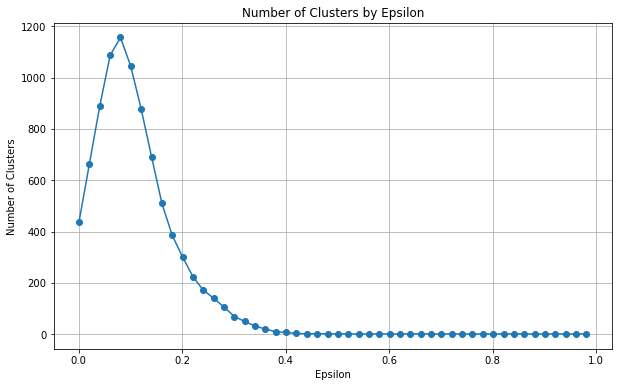

In [18]:
x = np.array(vectors)
x_subset = x[:15000]

# Define a range of epsilon values to try
epsilon_values = np.arange(0.001, 1, 0.02)

# Track the number of clusters for each epsilon value
num_clusters = []

# Iterate over each epsilon value
for epsilon in tqdm(epsilon_values):
    dbscan = DBSCAN(eps=epsilon, min_samples=2, metric='cosine').fit(x_subset)
    n_clusters = len(pd.Series(dbscan.labels_).value_counts()) - (1 if -1 in dbscan.labels_ else 0)
    num_clusters.append(n_clusters)

# Plot the number of clusters by epsilon
plt.figure(figsize=(10, 6))
plt.plot(epsilon_values, num_clusters, marker='o')
plt.title('Number of Clusters by Epsilon')
plt.xlabel('Epsilon')
plt.ylabel('Number of Clusters')
plt.grid(True)
plt.show()

In [19]:
sentence_subset = sentence[:15000]
results=pd.DataFrame ({'label':dbscan.labels_,'sent':sentence_subset})
example_result=results[results.label==0].sent.tolist()
event_df=df[df.title.isin(example_result)][['dateModified','scrapedDate','title','articleBody']]
event_df['dateModified']=pd.to_datetime(event_df.dateModified)
event_df = event_df.sort_values(by='dateModified').dropna()
event_df['scrapedDate']=pd.to_datetime(event_df.scrapedDate)
event_df = event_df.sort_values(by='scrapedDate').dropna()
event_df

,dateModified,scrapedDate,title,articleBody
204,2023-10-27 12:32:58+00:00,2023-10-27 13:10:39.044000+00:00,Gujarat HC shouldn’t take down clips of judge’...,When the Supreme Court institutionalised live-...
201,2023-10-26 20:45:00+00:00,2023-10-27 13:10:41.400000+00:00,With Congress In Words And Deeds: What The Dus...,Two Dussehra rallies took place on Tuesday in ...
206,2023-10-26 04:43:00+00:00,2023-10-27 13:10:41.401000+00:00,"After Shinde's jibe at Uddhav, Raut says Mahar...",Raut (in picture) riposte was in response to S...
202,2023-10-27 08:46:45+00:00,2023-10-27 13:10:42.022000+00:00,Shashi Tharoor’s Hamas reference at IUML pro-P...,"October 27, 2023 02:16 pm | Updated 03:41 pm I..."
203,2023-10-27 08:46:11+00:00,2023-10-27 13:10:42.022000+00:00,Why Tharoor’s comments on Hamas and terror fro...,"In March 2022, when the Congress ally Indian U..."
...,...,...,...,...
35106,2024-03-27 00:00:00+00:00,2024-03-28 16:35:29.470000+00:00,Wednesday Briefing,The growing gulf between Israel and the U.S. R...
35224,2024-03-25 00:00:00+00:00,2024-03-28 18:04:58.850000+00:00,Press TV's news headlines,US-Israeli genocide in Gaza Palestinians are e...
35312,2024-03-26 17:50:04+00:00,2024-03-28 19:31:23.849000+00:00,Pearls and Irritations,“There is no way they could have been consider...
36580,2024-03-29 00:00:00+00:00,2024-03-30 00:04:58.019000+00:00,Press TV's news headlines,ICJ Gaza ruling The head of the UN agency for ...


In [20]:
model = Word2Vec.load("word2vec.model")

def get_mean_vector(sents, model):
    vectors = [model.wv[word] for word in sents if word in model.wv]
    if not vectors:
        return np.zeros(model.vector_size)
    return np.mean(vectors, axis=0)

def get_central_vector(sents, model):
    vecs = [model.wv[word] for word in sents if word in model.wv]
    mean_vec = get_mean_vector(sents, model)
    if not vecs:
        return np.zeros(model.vector_size)
    index = pairwise_distances_argmin_min(np.array([mean_vec]), vecs)[0][0]
    return sents[index]


In [21]:
# Tokenize the titles
event_df['title_tokens'] = event_df['title'].apply(lambda x: x.split())

# Tokenize the article bodies
event_df['body_tokens'] = event_df['articleBody'].apply(lambda x: x.split())

# Calculate the mean vector and central word for each title
event_df['title_mean_vector'] = event_df['title_tokens'].apply(lambda x: get_mean_vector(x, model))
event_df['title_central_word'] = event_df['title_tokens'].apply(lambda x: get_central_vector(x, model))

# Calculate the mean vector and central word for each article body
event_df['body_mean_vector'] = event_df['body_tokens'].apply(lambda x: get_mean_vector(x, model))
event_df['body_central_word'] = event_df['body_tokens'].apply(lambda x: get_central_vector(x, model))


In [22]:
# Sort the DataFrame by scrapedDate
event_df = event_df.sort_values(by='scrapedDate').reset_index(drop=True)

# Iterate through the DataFrame to summarize the events
summary = []
for index, row in event_df.iterrows():
    start_date = row['dateModified'].strftime('%d %B %Y')
    end_date = row['scrapedDate'].strftime('%d %B %Y') if row['scrapedDate'] is not None else 'present'
    summary.append(f"{start_date} – {end_date}: {row['title']}")

# Print the summarized events
for event_summary in summary:
    print(event_summary)


27 October 2023 – 27 October 2023: Gujarat HC shouldn’t take down clips of judge’s outburst. Transparency can’t be conditional
26 October 2023 – 27 October 2023: With Congress In Words And Deeds: What The Dussehra Rally Revealed About The 'New' Uddhav Thackeray
26 October 2023 – 27 October 2023: After Shinde's jibe at Uddhav, Raut says Maharashtra CM is Hamas
27 October 2023 – 27 October 2023: Shashi Tharoor’s Hamas reference at IUML pro-Palestine rally triggers political row in Kerala
27 October 2023 – 27 October 2023: Why Tharoor’s comments on Hamas and terror from a Muslim League stage are significant
27 October 2023 – 27 October 2023: 'Nothing more to say': Shashi Tharoor on row over speech at IUML pro-Palestine rally
27 October 2023 – 27 October 2023: Morning Digest | Mobile internet ban in Manipur extended till October 31; ED searches against Rajasthan Congress leaders kick up row ahead of Assembly polls, and more
27 October 2023 – 27 October 2023: Constable sent flying after SUV

In [24]:
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=event_df['scrapedDate'],
    y=[1] * len(event_df),  # All events on the same y-level
    mode='markers+lines',
    marker=dict(size=10),
    line=dict(width=2),
    text=event_df['title'],
    hoverinfo='text'
))

# Customize the layout
fig.update_layout(
    title='Timeline of Events',
    xaxis_title='Date',
    yaxis_title='Events',
    yaxis=dict(showticklabels=False),  # Hide y-axis labels
    xaxis=dict(showline=True, zeroline=False),
    showlegend=False,
    hovermode='closest'
)

# Show the plot
fig.show()